# Import library

In [2]:
import rasterio
import torchgeo
import torch
import torch.nn as nn
import rioxarray
import numpy as np
import matplotlib.pyplot as plt
# import pycuda.driver as cuda

# Set seed to make it reproducible

In [3]:
# Set seeds for reproducibility
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)

# Import data

## Sentinel-2 image

In [4]:
sentinel2_path = '../data/raw/sentinel-2/sentinel2_openeo_med_4months_dresden.geotiff'
data = rioxarray.open_rasterio(sentinel2_path)

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as 

In [5]:
data.band

<xarray.DataArray 'band' (band: 13)> Size: 104B
array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13])
Coordinates:
  * band         (band) int64 104B 1 2 3 4 5 6 7 8 9 10 11 12 13
    spatial_ref  int64 8B 0

In [6]:
data.sel(band=1).dtype

dtype('int16')

Min and max normalization give the worst result according to https://medium.com/sentinel-hub/how-to-normalize-satellite-images-for-deep-learning-d5b668c885af

In [7]:
# Normalize the bands to the range [0, 1]
def normalize(array):
    array_min, array_max = array.min(), array.max()
    return (array - array_min) / (array_max - array_min)

In [8]:
# 2th percentile to 98th percentile
# Apply a percentile-based contrast stretch (ignore the extreme values so image isn't too dark or too bright)
def contrast_stretch(array, lower_percentile=2, upper_percentile=98):
    # print(array.min())
    lower = np.percentile(array, lower_percentile)
    upper = np.percentile(array, upper_percentile)
    array = np.clip(array, lower, upper) # clip -> limit the values in an array to specific range
    return (array - lower) / (upper - lower) # normalization

In [9]:
# 2th percentile to 98th percentile
# Apply a percentile-based contrast stretch (ignore the extreme values so image isn't too dark or too bright)
def contrast_stretch_new(array, lower_percentile=1, upper_percentile=99):
    # print(array.min())
    lower = np.percentile(array, lower_percentile)
    upper = np.percentile(array, upper_percentile)
    array = np.clip(array, lower, upper) # clip -> limit the values in an array to specific range
    return (array - lower) / (upper - lower) # normalization

In [10]:
# # 1th percentile to 99th percentile
# # Apply a percentile-based contrast stretch (ignore the extreme values so image isn't too dark or too bright)
# def contrast_stretch_new(array, lower_percentile=1, upper_percentile=99):
#     min_value = array.min().item()
#     # valid_area = np.ones_like(array[0], dtype=bool)
#     # for band in range(array.shape[0]):
#     #     valid_area = valid_area & (array[band] != min_value)

#     img_area = (array!=min_value) # create a mask or valid area

#     print('img_area: ', img_area.shape)
#     print('array: ', array.shape)
#     array_new = np.where(array == min_value, np.nan, array) # replace min_value
#     lower = np.percentile(array_new[img_area], lower_percentile)
#     upper = np.percentile(array_new[img_area], upper_percentile)
#     print('lower: ', lower)
#     print('upper: ', upper)
#     array = np.clip(array_new, lower, upper) # clip -> limit the values in an array to specific range
#     result = (array - lower) / (upper - lower) # normalization
#     result[~img_area] = 0
#     result = torch.from_numpy(result)
    
#     return result

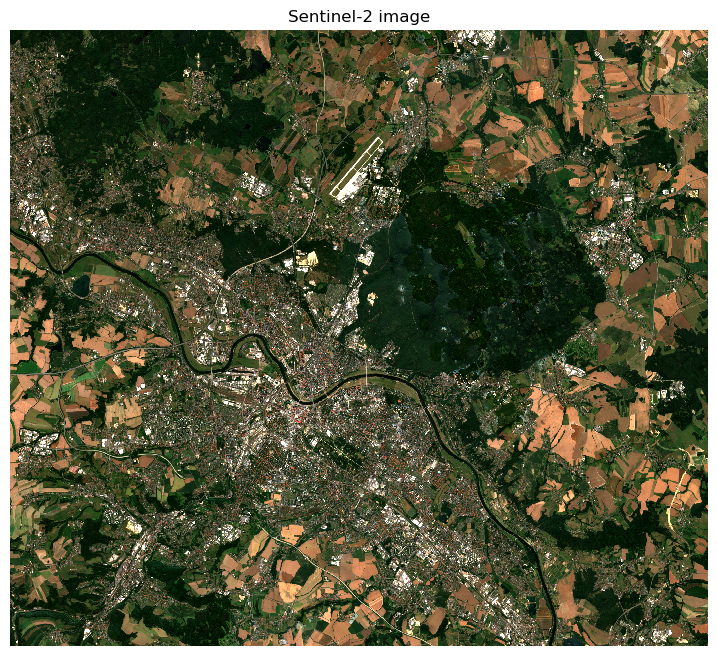

In [12]:
# Plot the raster data
plt.figure(figsize=(9,8))
# normalize(data).sel(band=[4, 3, 2]).plot.imshow()

contrast_stretch_new(data.sel(band=[4,3,2])).plot.imshow()
plt.title("Sentinel-2 image")
# plt.xlabel("Longitude")
# plt.ylabel("Latitude")
plt.axis("off")
plt.show()

## Binary mask

In [13]:
mask_path = '../data/processed/osm/public_green_spaces_dresden.geotiff'
mask_data = rioxarray.open_rasterio(mask_path)

In [14]:
mask_data = mask_data.astype('float32')

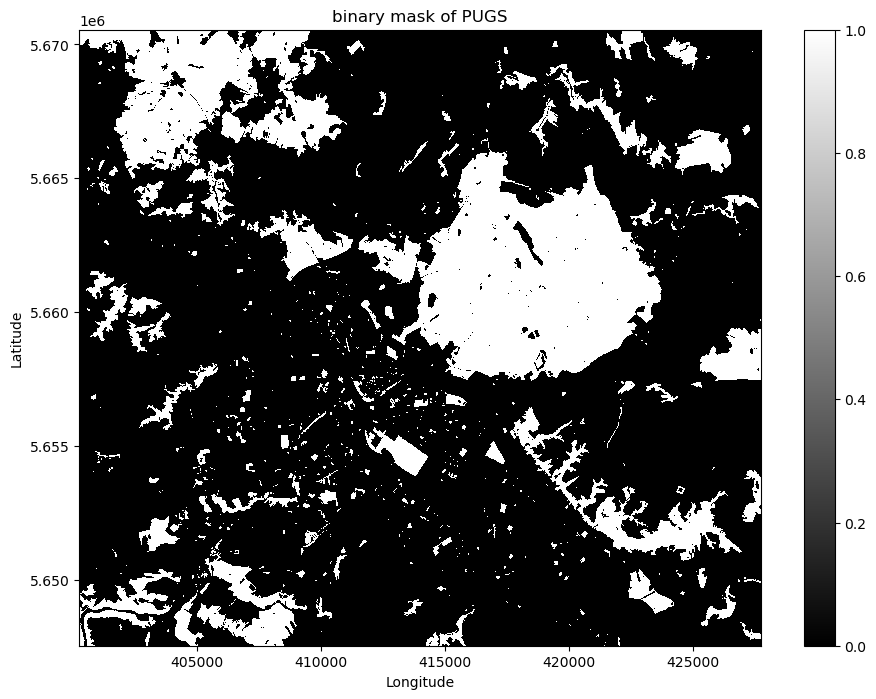

In [15]:
# Plot the raster data
plt.figure(figsize=(11,8))
# normalize(data).sel(band=[4, 3, 2]).plot.imshow()
mask_data.sel(band=1).plot.imshow(cmap='gray')
plt.title("binary mask of PUGS")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

## NDVI raster

In [16]:
ndvi_path = '../data/raw/sentinel-2/ndvi_sentinel2_openeo_med_4months_dresden.geotiff'
ndvi_data = rioxarray.open_rasterio(ndvi_path)

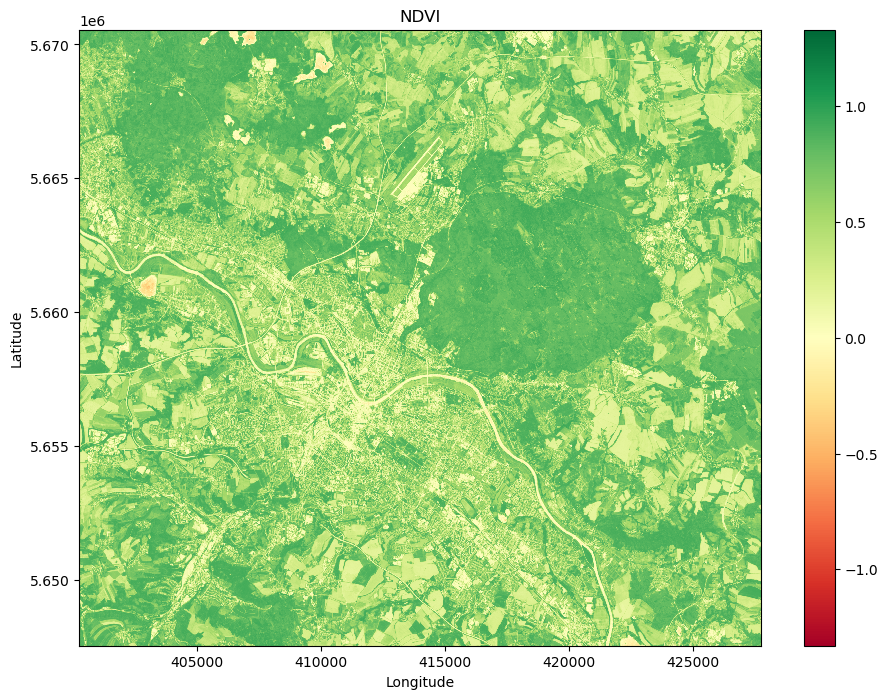

In [17]:
# Plot the raster data
plt.figure(figsize=(11,8))
# normalize(data).sel(band=[4, 3, 2]).plot.imshow()
ndvi_data.sel(band=1).plot.imshow(cmap='RdYlGn')
plt.title("NDVI")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

## NDWI raster

In [18]:
ndwi_path = '../data/raw/sentinel-2/ndwi_sentinel2_openeo_med_4months_dresden.geotiff'
ndwi_data = rioxarray.open_rasterio(ndwi_path)

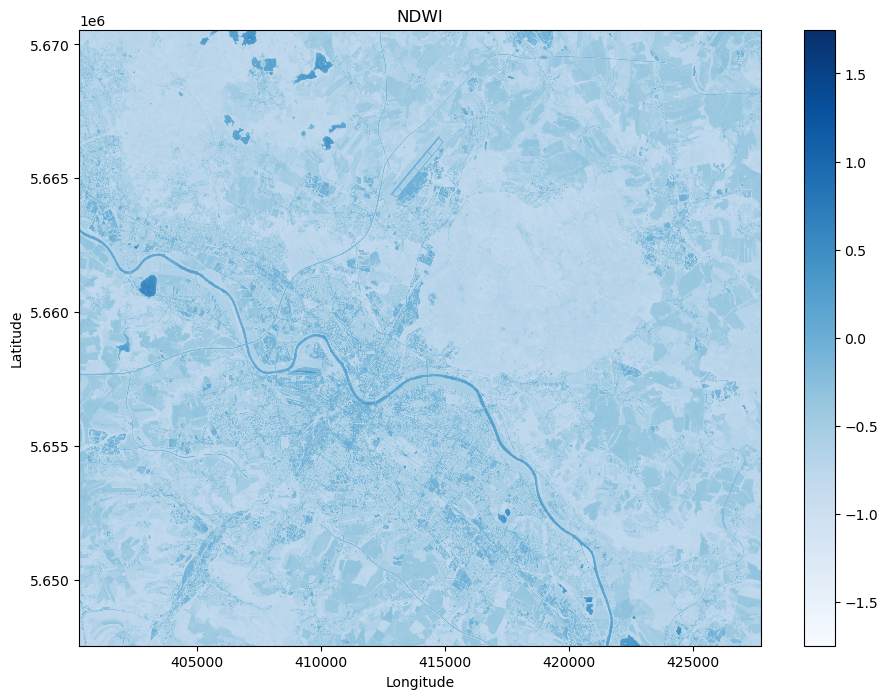

In [19]:
# Plot the raster data
plt.figure(figsize=(11,8))
# normalize(data).sel(band=[4, 3, 2]).plot.imshow()
ndwi_data.sel(band=1).plot.imshow(cmap='Blues')
plt.title("NDWI")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# NDBI raster

In [20]:
ndbi_path = '../data/raw/sentinel-2/ndbi_sentinel2_openeo_med_4months_dresden.geotiff'
ndbi_data = rioxarray.open_rasterio(ndbi_path)

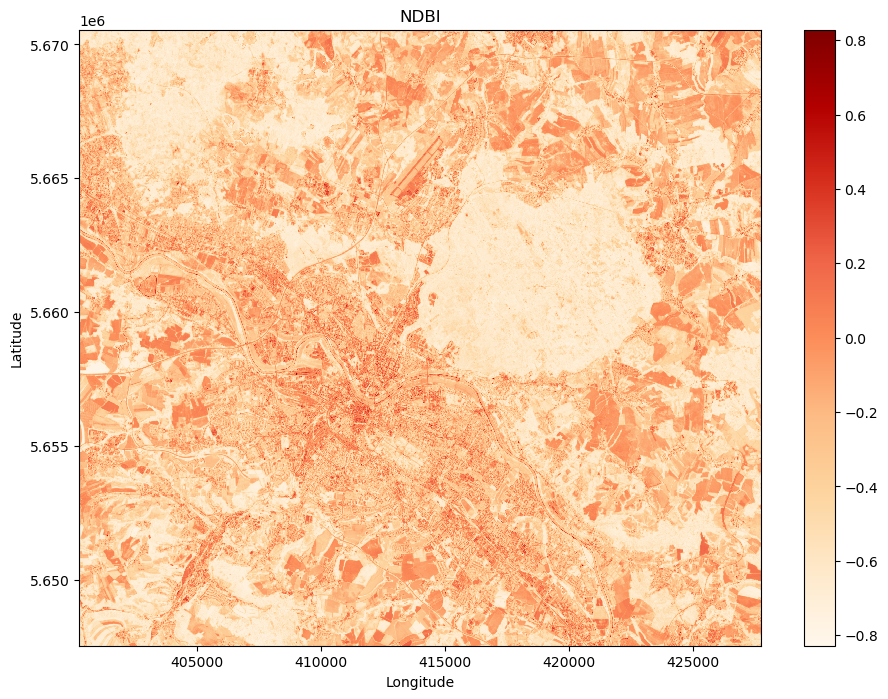

In [21]:
# Plot the raster data
plt.figure(figsize=(11,8))
# normalize(data).sel(band=[4, 3, 2]).plot.imshow()
ndbi_data.sel(band=1).plot.imshow(cmap='OrRd')
plt.title("NDBI")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# Create image patches (Torchgeo)

## Create ROI for training, validation, and test set

manually specify

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as 

5494.0 4602.0
Tile 1 saved to ../data/processed/tiles/test/tile_1.geotiff
Tile 2 saved to ../data/processed/tiles/val/tile_2.geotiff
Tile 3 saved to ../data/processed/tiles/train/tile_3.geotiff
Tile 4 saved to ../data/processed/tiles/test/tile_4.geotiff
Tile 5 saved to ../data/processed/tiles/val/tile_5.geotiff
Tile 6 saved to ../data/processed/tiles/train/tile_6.geotiff
Tile 7 saved to ../data/processed/tiles/train/tile_7.geotiff
Tile 8 saved to ../data/processed/tiles/train/tile_8.geotiff
Tile 9 saved to ../data/processed/tiles/val/tile_9.geotiff
Tile 10 saved to ../data/processed/tiles/test/tile_10.geotiff
Tile 11 saved to ../data/processed/tiles/train/tile_11.geotiff
Tile 12 saved to ../data/processed/tiles/train/tile_12.geotiff
Tile 13 saved to ../data/processed/tiles/train/tile_13.geotiff
Tile 14 saved to ../data/processed/tiles/test/tile_14.geotiff
Tile 15 saved to ../data/processed/tiles/train/tile_15.geotiff
Tile 16 saved to ../data/processed/tiles/train/tile_16.geotiff
Tile 1

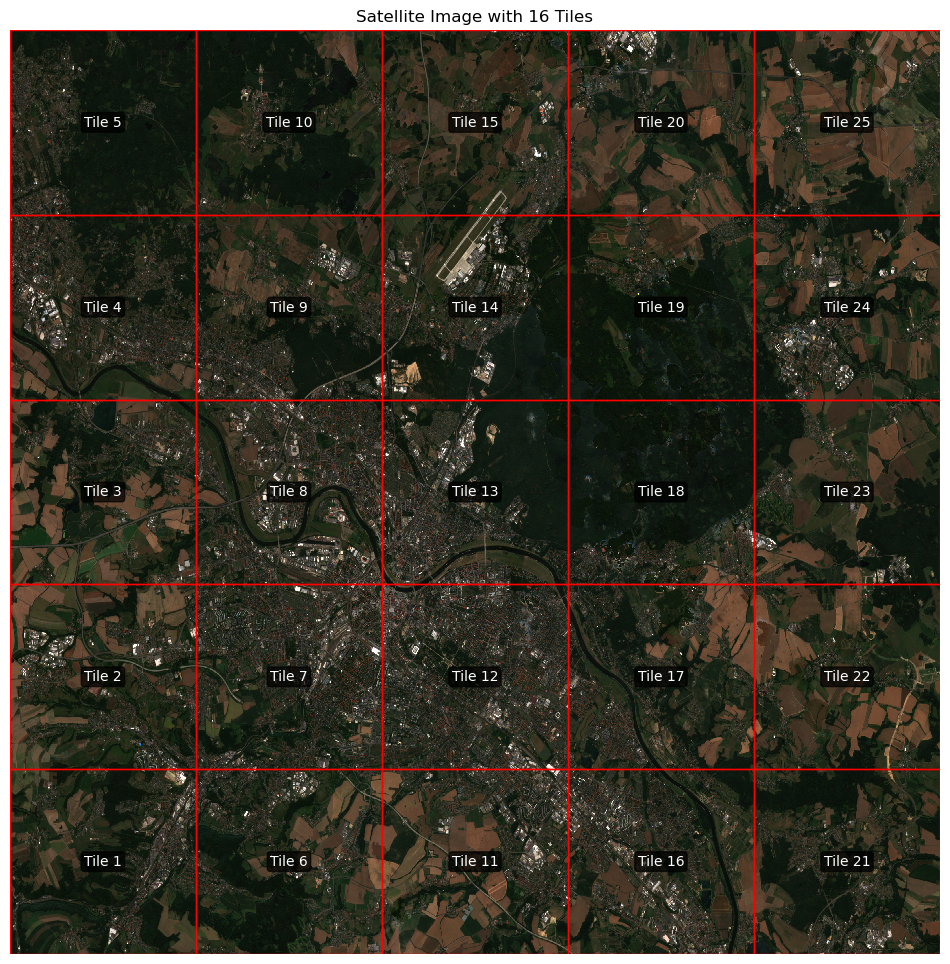

In [22]:
import matplotlib.patches as patches
import os

# Create a folder for saving the tiles
folder_path = '../data/processed/tiles'
os.makedirs(folder_path, exist_ok=True)

# Open the raster data
rds = rioxarray.open_rasterio(sentinel2_path)

rds_sample = rds.isel(band=0)

# Get the bounds of the image
xmin, ymin, xmax, ymax = rds.rio.bounds()

# Calculate the width and height of each tile
tile_width = (xmax - xmin) // 5
tile_height = (ymax - ymin) // 5
print(tile_width, tile_height)

# train, validation, test index list
train_index_list = [3, 6, 7, 8, 11, 12, 13, 15, 16, 18, 19, 20, 22, 23, 25]
val_index_list = [2, 9, 5, 21, 24]
test_index_list = [1, 4, 10, 14, 17]

# Create 25 tiles (5x5 grid)
tiles = []
for i in range(5):
    for j in range(5):
        tile_xmin = xmin + i * tile_width
        tile_xmax = tile_xmin + tile_width
        tile_ymin = ymin + j * tile_height
        tile_ymax = tile_ymin + tile_height
        tiles.append([tile_xmin, tile_xmax, tile_ymin, tile_ymax])

# Plot the original satellite image with bounding boxes for the 16 tiles
plt.figure(figsize=(12, 12))
contrast_stretch_new(data).sel(band=[4, 3, 2]).plot.imshow()
plt.axis('off')

# Add bounding boxes for each tile
ax = plt.gca()
for idx, tile in enumerate(tiles):
    tile_xmin, tile_xmax, tile_ymin, tile_ymax = tile
    width = tile_xmax - tile_xmin
    height = tile_ymax - tile_ymin
    
    # Create a rectangle patch
    rect = patches.Rectangle((tile_xmin, tile_ymin), width, height, 
                            linewidth=1, edgecolor='r', facecolor='none')
    
    # Add the rectangle to the plot
    ax.add_patch(rect)
    
    # Add text label for the tile number
    plt.text(tile_xmin + width/2, tile_ymin + height/2, f'Tile {idx+1}', 
             ha='center', va='center', color='white', fontsize=10,
             bbox=dict(facecolor='black', alpha=0.7, boxstyle='round,pad=0.2'))

    # Clip the raster to this tile and save it
    if (idx+1) in train_index_list:
        subfolder_path = os.path.join(folder_path, 'train')
        os.makedirs(subfolder_path, exist_ok=True)
    elif (idx+1) in val_index_list:
        subfolder_path = os.path.join(folder_path, 'val')
        os.makedirs(subfolder_path, exist_ok=True)
    else:
        subfolder_path = os.path.join(folder_path, 'test')
        os.makedirs(subfolder_path, exist_ok=True)

    tile_rds = rds.rio.clip_box(minx=tile_xmin, miny=tile_ymin, maxx=tile_xmax, maxy=tile_ymax)
    tile_file_path = os.path.join(subfolder_path, f'tile_{idx + 1}.geotiff')
    tile_rds.rio.to_raster(tile_file_path, driver='GTiff')
    print(f"Tile {idx + 1} saved to {tile_file_path}")

plt.title('Satellite Image with 16 Tiles')
# plt.savefig('satellite_image_with_tiles.png', dpi=300)
plt.show()

---

In [23]:
from torchgeo.datasets import RasterDataset, VectorDataset, unbind_samples, stack_samples, Sentinel2
from pyproj import CRS

train_path = '../data/processed/tiles/train'
train_ds = RasterDataset(paths=train_path, crs=CRS.from_epsg(32633), res=10)

In [24]:
train_ds.bounds

BoundingBox(minx=400260.0, maxx=427730.0, miny=5647540.0, maxy=5670550.0, mint=0.0, maxt=9.223372036854776e+18)

In [25]:
train_label = VectorDataset(paths='../data/processed/osm/public_green_spaces_dresden.geojson', crs=CRS.from_epsg(32633), res=10)

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/pyproj/crs/crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


In [26]:
new_train_ds = train_ds & train_label

In [27]:
from torchgeo.samplers import RandomGeoSampler

# with RandomGeoSampler -> it won't be reproducible
torch.manual_seed(seed)
sampler = RandomGeoSampler(new_train_ds, size=(256, 256), length=100)

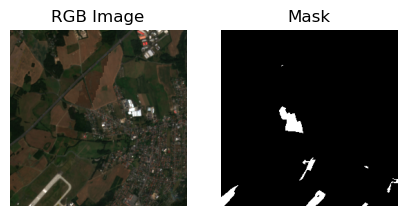

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/pyproj/crs/crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


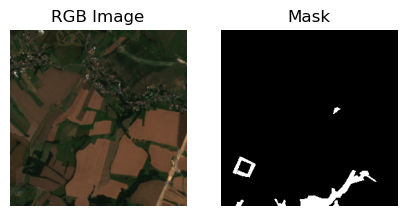

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/pyproj/crs/crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


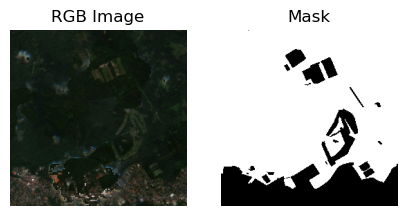

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/pyproj/crs/crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


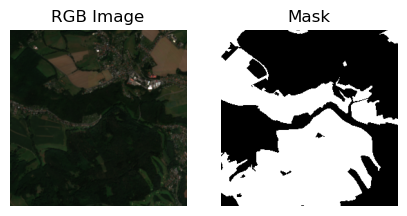

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/pyproj/crs/crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


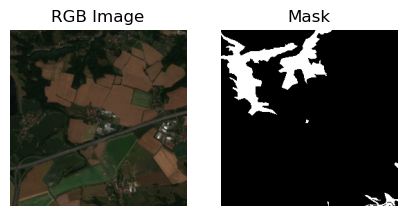

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/pyproj/crs/crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


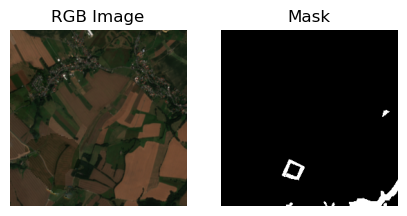

In [28]:
torch.manual_seed(seed)
for i, bbox in enumerate(sampler):
    sample = new_train_ds[bbox]

    arr = contrast_stretch_new(sample['image']).numpy()
    mask = sample['mask'].numpy()

    # Transpose the array to get the correct shape for RGB (height, width, channels)
    rgb = arr.transpose(1, 2, 0)[:, :, [3, 2, 1]]

    fig, ax = plt.subplots(1, 2, figsize=(5, 5))
    
    # Display the RGB image in the first subplot
    ax[0].imshow(rgb)
    ax[0].set_title('RGB Image')
    ax[0].axis('off')

    # Display the mask in the second subplot
    ax[1].imshow(mask, cmap='gray')
    ax[1].set_title('Mask')
    ax[1].axis('off')

    plt.show()
    
    if i == 5:
        break

---

In [29]:
# bbox = next(iter(sampler))
# sample = new_train_ds[bbox]
# print(sample.keys())
# print(sample['image'].shape)
# print(sample['mask'].shape)

In [30]:
# arr = contrast_stretch_new(sample['image']).numpy()
# mask = sample['mask'].numpy()

# # Print the shape of the image array
# print(arr.shape)

# # Transpose the array to get the correct shape for RGB (height, width, channels)
# rgb = arr.transpose(1, 2, 0)[:, :, [3, 2, 1]]

# # Create a figure with two subplots
# fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# # Display the RGB image in the first subplot
# axes[0].imshow(rgb)
# axes[0].set_title('RGB Image')
# axes[0].axis('off')

# # Display the mask in the second subplot
# axes[1].imshow(mask, cmap='gray')
# axes[1].set_title('Mask')
# axes[1].axis('off')

# # Show the figure
# plt.show()

In [31]:
from torchgeo.datasets import RasterDataset, VectorDataset, unbind_samples, stack_samples, Sentinel2
from pyproj import CRS

train_ds = RasterDataset(paths=sentinel2_path, crs=CRS.from_epsg(32633), res=10)

In [32]:
train_ds.bounds

BoundingBox(minx=400260.0, maxx=427730.0, miny=5647540.0, maxy=5670550.0, mint=0.0, maxt=9.223372036854776e+18)

In [33]:
# from torchgeo.datasets.utils import BoundingBox

# train_bounds = BoundingBox(*roi_1, mint=0, maxt=1)
# test_bounds = BoundingBox(*roi_2, mint=0, maxt=1)

In [34]:
from torchgeo.samplers import RandomGeoSampler, GridGeoSampler

sampler = GridGeoSampler(train_ds, size=(256, 256), stride=64)

In [35]:
import torch

torch.manual_seed(0) # this is to get the same result in every pass
bbox = next(iter(sampler))
print(bbox)
sample = train_ds[bbox]
print(sample.keys())
print(sample['image'].shape)

BoundingBox(minx=400260.0, maxx=402820.0, miny=5647540.0, maxy=5650100.0, mint=0.0, maxt=9.223372036854776e+18)
dict_keys(['crs', 'bounds', 'image'])
torch.Size([13, 256, 256])


Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as 

(13, 256, 256)


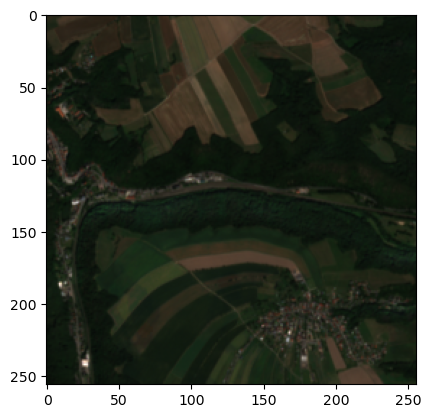

In [36]:
import torch
import matplotlib.pyplot as plt

# arr = torch.clamp(sample['image']/10000, min=0, max=1).numpy()
arr = contrast_stretch_new(sample['image']).numpy()
# arr = torch.from_numpy(arr)
print(arr.shape)
# Transpose the array to get the correct shape for RGB (height, width, channels)
rgb = arr.transpose(1, 2, 0)[:, :, [3, 2 , 1]]

plt.imshow(rgb)

In [37]:
train_label = VectorDataset(paths='../data/processed/osm/public_green_spaces_dresden.geojson', crs=CRS.from_epsg(32633), res=10)

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/pyproj/crs/crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


In [38]:
new_train_ds = train_ds & train_label

In [39]:
sampler = GridGeoSampler(new_train_ds, size=(256, 256), stride=64)

In [40]:
len(sampler)

1320

In [41]:
bbox = next(iter(sampler))
sample = new_train_ds[bbox]
print(sample.keys())
print(sample['image'].shape)
print(sample['mask'].shape)

dict_keys(['crs', 'bounds', 'image', 'mask'])
torch.Size([13, 256, 256])
torch.Size([256, 256])


(13, 256, 256)


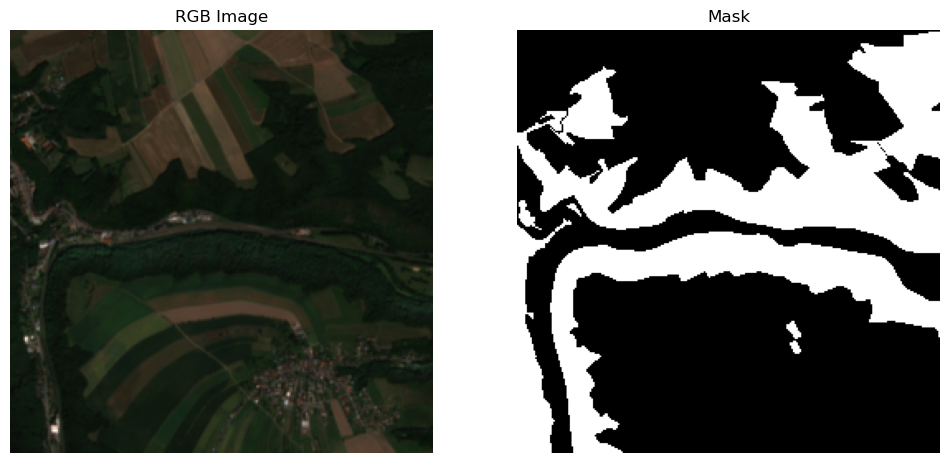

In [42]:
arr = contrast_stretch_new(sample['image']).numpy()
mask = sample['mask'].numpy()

# Print the shape of the image array
print(arr.shape)

# Transpose the array to get the correct shape for RGB (height, width, channels)
rgb = arr.transpose(1, 2, 0)[:, :, [3, 2, 1]]

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Display the RGB image in the first subplot
axes[0].imshow(rgb)
axes[0].set_title('RGB Image')
axes[0].axis('off')

# Display the mask in the second subplot
axes[1].imshow(mask, cmap='gray')
axes[1].set_title('Mask')
axes[1].axis('off')

# Show the figure
plt.show()

---

In [43]:
import warnings

# Option 1: Suppress just this specific warning
warnings.filterwarnings(
    "ignore", 
    message="You will likely lose important projection information when converting to a PROJ string from another format.*", 
    category=UserWarning
)

In [44]:
# 1th percentile to 99th percentile
# Apply a percentile-based contrast stretch (ignore the extreme values so image isn't too dark or too bright)
def contrast_stretch_patch(array, lower_percentile=1, upper_percentile=99):
    min_value = array.min().item()
    # valid_area = np.ones_like(array[0], dtype=bool)
    # for band in range(array.shape[0]):
    #     valid_area = valid_area & (array[band] != min_value)

    img_area = (array!=min_value) # create a mask of valid area

    array_new = np.where(array == min_value, np.nan, array) # replace min_value
    lower = np.percentile(array_new[img_area], lower_percentile)
    upper = np.percentile(array_new[img_area], upper_percentile)
    print('lower: ', lower)
    print('upper: ', upper)
    array = np.clip(array_new, lower, upper) # clip -> limit the values in an array to specific range
    result = (array - lower) / (upper - lower) # normalization
    result[~img_area] = 0
    result = torch.from_numpy(result)
    
    return result, img_area

In [45]:
def process_mask(mask, valid_area):
    mask = mask.numpy()
    valid_area = valid_area.numpy()
    mask[~valid_area[0]] = 0
    result = torch.from_numpy(mask)
    return result

# Start create patches

In [46]:
from torch.utils.data import DataLoader

# Set seed for reproducibility
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)

In [47]:
# Define paths for your pre-split tiles
train_image_path = '../data/processed/tiles/train'
val_image_path = '../data/processed/tiles/val'
test_image_path = '../data/processed/tiles/test'

In [48]:
# Vector data path
label_path = '../data/processed/osm/public_green_spaces_dresden.geojson'

In [76]:
# Create a custom filtering function
def filter_patches(sample):
    """Filter patches that contain only background or only PUGS"""
    mask = sample['mask'].numpy()
    # Calculate percentage of green space in the mask
    green_percentage = np.mean(mask)
    
    # Keep patches that have between 5% and 95% green space
    return 0.05 < green_percentage < 0.95

In [77]:
from torchgeo.transforms import AugmentationSequential, indices
import torch
from torchvision import transforms as T
import kornia.augmentation as K

# Create augmentation sequence
# p parameter is the probability of applying the transformation
transform_test = AugmentationSequential(
    # Standard spatial augmentations
    K.RandomHorizontalFlip(p=0.5),
    K.RandomVerticalFlip(p=0.5),
    # Define which keys and indices to apply transformations to
    data_keys=['image', 'mask']
)

In [123]:
# Custom dataset class that applies filtering
class FilteredGeoDataset:
    # stride is set as 64 for both x and y directions
    def __init__(self, dataset, patch_size=256, stride=64, transform=None):
        self.dataset = dataset
        self.sampler = GridGeoSampler(dataset, size=(patch_size, patch_size), stride=stride)
        self.transform = transform
        self.bounds = dataset.bounds
        
        # Compute the valid patches
        self.valid_bboxes = []
        for bbox in self.sampler:
            sample = self.dataset[bbox]
            if filter_patches(sample):
                self.valid_bboxes.append(bbox)
                # print("in")
        print(f"Found {len(self.valid_bboxes)} valid patches out of {len(self.sampler)} total patches")
    
    def __len__(self):
        return len(self.valid_bboxes)
    
    def __getitem__(self, idx):
        sample = self.dataset[self.valid_bboxes[idx]]
        
        # Apply normalization
        sample['image'], valid_area = contrast_stretch_patch(sample['image'])
        sample['mask'] = process_mask(sample['mask'], valid_area)
        print(sample['image'].shape)
        print(sample['mask'].shape)
        print(sample.keys())
        # Apply transform for augmentation
        if self.transform is not None:
            sample = self.transform(sample)
            print("image shape after augmentation:", sample['image'].shape)
            print("mask shape after augmentation:", sample['image'].shape)
            sample['image'] = sample['image'].squeeze(0)
            sample['mask'] = sample['mask'].squeeze(0)
        
        del sample["crs"]
        del sample["bounds"]

        return sample

In [124]:
# Create datasets for each split
def create_dataset_split(image_path, label_path, dataset_type):
    image_ds = RasterDataset(paths=image_path, crs=CRS.from_epsg(32633), res=10)
    label_ds = VectorDataset(paths=label_path, crs=CRS.from_epsg(32633), res=10)
    combined_ds = image_ds & label_ds
    if dataset_type == 'train':
        return FilteredGeoDataset(dataset=combined_ds, stride=64, transform=transform_test)
    else:
        return FilteredGeoDataset(dataset=combined_ds, stride=64)

In [125]:
# Create the filtered datasets
train_dataset = create_dataset_split(train_image_path, label_path, 'train')

Found 258 valid patches out of 450 total patches


In [126]:
val_dataset = create_dataset_split(val_image_path, label_path, 'validation')
test_dataset = create_dataset_split(test_image_path, label_path, 'test')

Found 122 valid patches out of 150 total patches
Found 134 valid patches out of 150 total patches


In [127]:
# Create DataLoaders
batch_size = 8

train_loader = DataLoader(
    train_dataset, 
    batch_size=batch_size,
    shuffle=True,
    collate_fn=stack_samples
)

In [128]:
val_loader = DataLoader(
    val_dataset, 
    batch_size=batch_size,
    collate_fn=stack_samples
)

test_loader = DataLoader(
    test_dataset, 
    batch_size=batch_size,
    collate_fn=stack_samples
)

In [129]:
# # Visualize some training samples
# for i, sample in enumerate(train_dataset):
#     arr = sample['image'].numpy()
#     mask = sample['mask'].numpy()

#     # Print the shape of the image array
#     print(f"Sample {i} - Image shape: {arr.shape}, Mask shape: {mask.shape}")
#     print(f"Green space percentage: {np.mean(mask):.2f}")

#     # Transpose the array to get the correct shape for RGB (height, width, channels)
#     rgb = arr.transpose(1, 2, 0)[:, :, [3, 2, 1]]

#     # Create a figure with two subplots
#     fig, axes = plt.subplots(1, 2, figsize=(12, 6))

#     # Display the RGB image in the first subplot
#     axes[0].imshow(rgb)
#     axes[0].set_title('RGB Image')
#     axes[0].axis('off')

#     # Display the mask in the second subplot
#     axes[1].imshow(mask, cmap='gray')
#     axes[1].set_title('Mask')
#     axes[1].axis('off')

#     # Show the figure
#     plt.show()
    
#     if i >= 4:  # Show only 5 samples
#         break

lower:  4.0
upper:  3703.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
image shape after augmentation: torch.Size([1, 13, 256, 256])
mask shape after augmentation: torch.Size([1, 13, 256, 256])
lower:  4.0
upper:  4130.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
image shape after augmentation: torch.Size([1, 13, 256, 256])
mask shape after augmentation: torch.Size([1, 13, 256, 256])
lower:  4.0
upper:  3872.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
image shape after augmentation: torch.Size([1, 13, 256, 256])
mask shape after augmentation: torch.Size([1, 13, 256, 256])
lower:  5.0
upper:  4399.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
image shape after augmentation: torch.Size([1, 13, 256, 256])
mask shape after augmentation: torch.Size([1, 13, 256, 256])
lower:  4.0
uppe

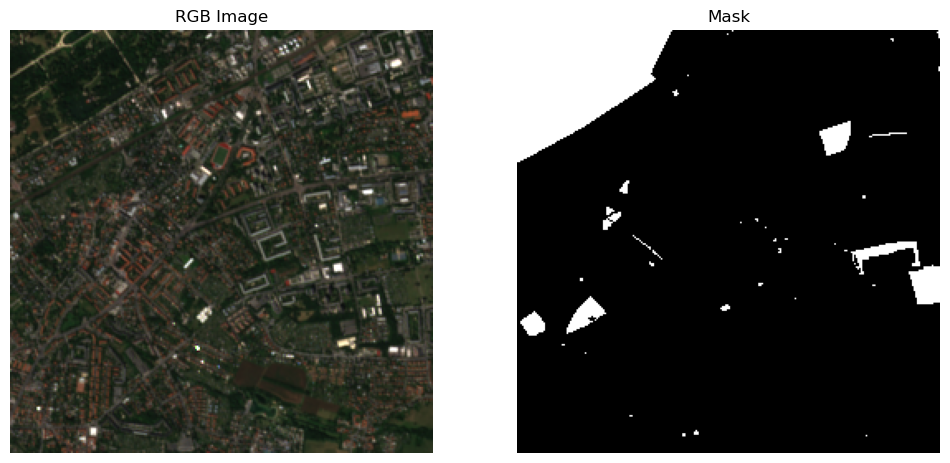

Sample 1:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.05


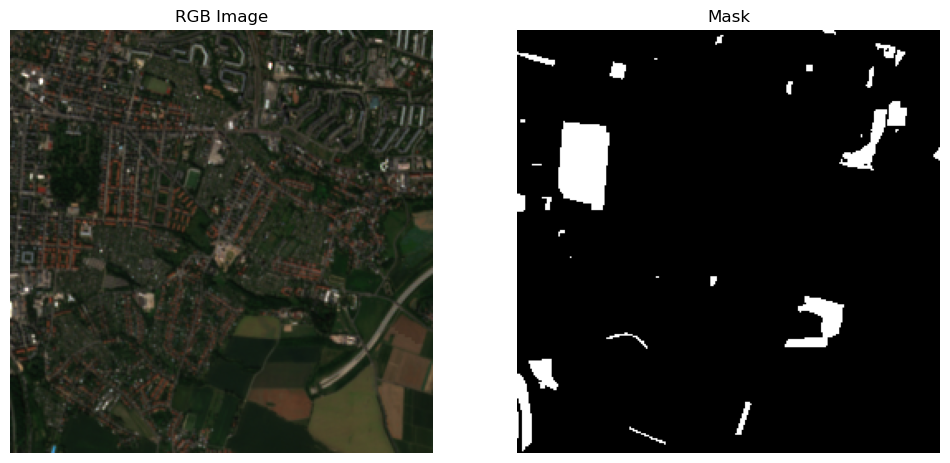

Sample 2:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.71


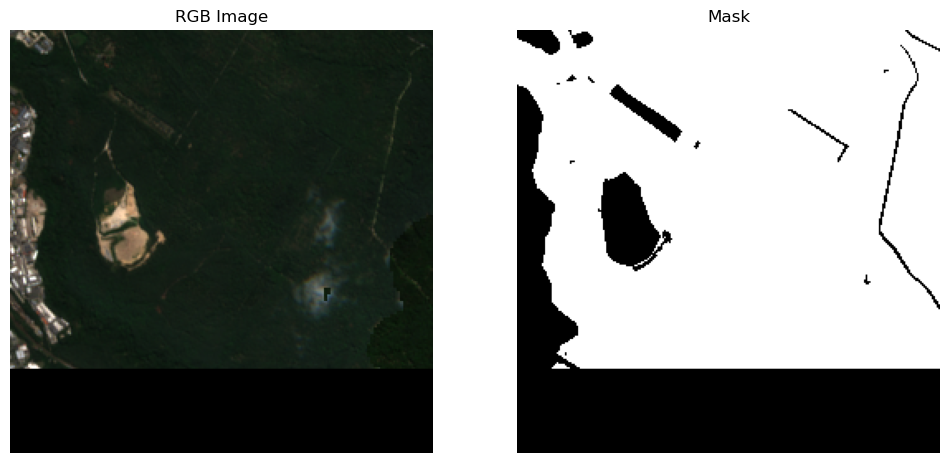

Sample 3:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.17


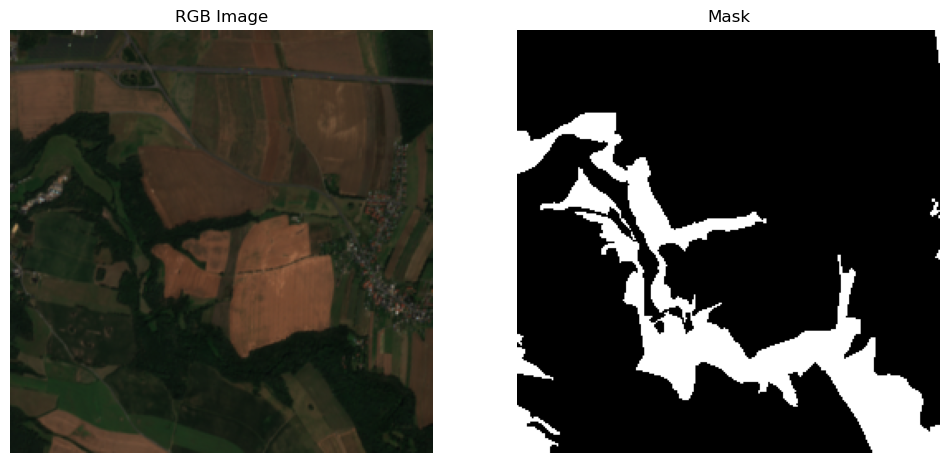

Sample 4:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.23


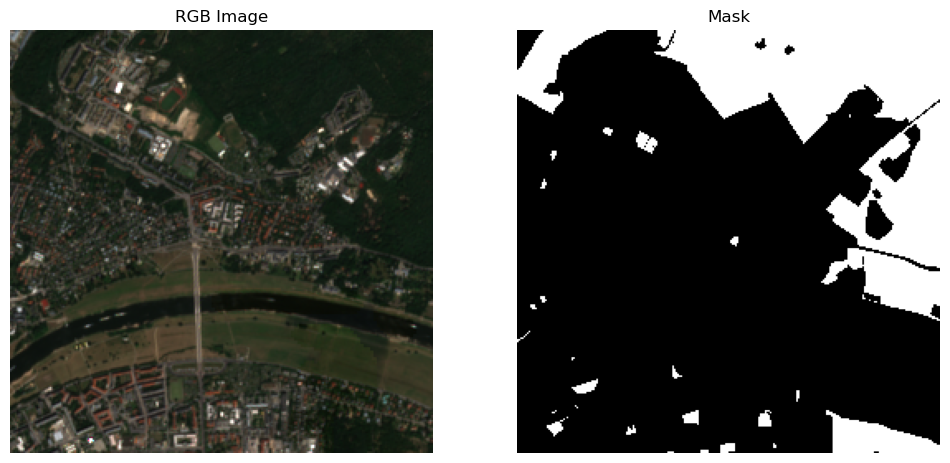

Sample 5:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.09


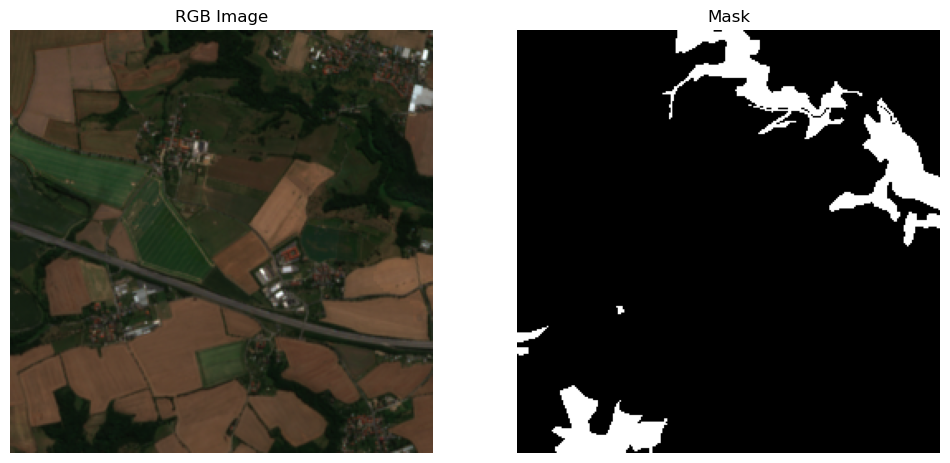

Sample 6:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.09


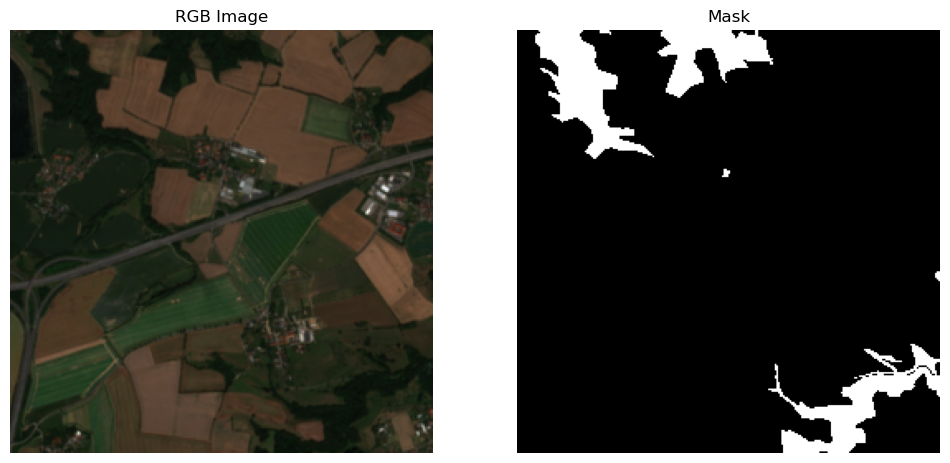

Sample 7:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.09


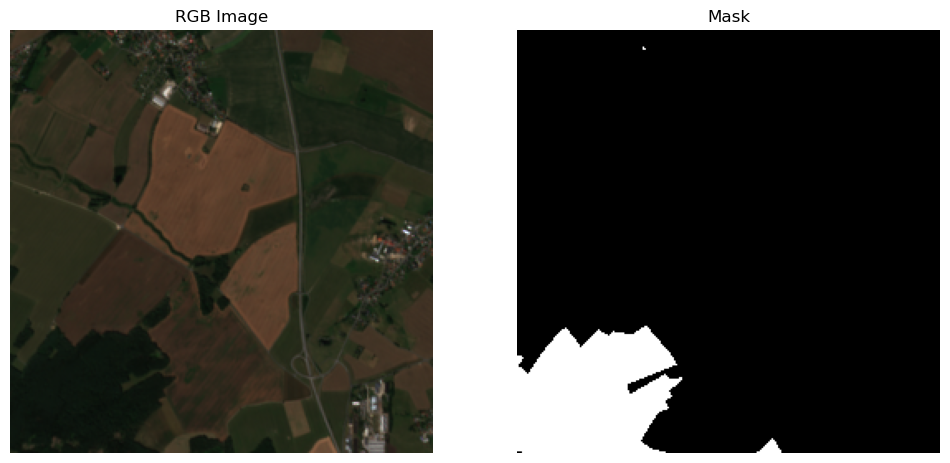

In [130]:
def visualize_from_torchgeo_dataloader(dataloader, num_samples=3):
    """Visualize samples from a TorchGeo DataLoader with stack_samples"""
    torch.manual_seed(seed)
    # Get a batch from the dataloader
    dataiter = iter(dataloader)
    batch = next(dataiter)
    # print(batch.keys())
    # augment_batch = transform_test(batch)
    # print(augment_batch.keys())

    # range(min(num_samples, augment_batch['image'].shape[0]))
    for i in range(batch['image'].shape[0]):
        # Get the image and mask for this sample
        image = batch['image'][i]
        mask = batch['mask'][i]
        
        # Convert to numpy for visualization
        image_np = image.numpy()
        mask_np = mask.numpy()
        
        # Print information about the sample
        print(f"Sample {i}:")
        print(f"  Image shape: {image_np.shape}")
        print(f"  Mask shape: {mask_np.shape}")
        print(f"  Green space percentage: {np.mean(mask_np):.2f}")
        
        # For sentinel-2 data, use bands 4,3,2 (R,G,B) or 8,4,3 (NIR,R,G)
        # Assuming bands are [C, H, W]
        if image_np.shape[0] > 3:  # Multi-spectral image
            rgb = image_np[[3, 2, 1], :, :].transpose(1, 2, 0)  # Select 4,3,2 bands (RGB bands)
        else:
            rgb = image_np.transpose(1, 2, 0)
        
        # Create a figure with two subplots
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        
        # Display the RGB image in the first subplot
        axes[0].imshow(rgb)
        axes[0].set_title('RGB Image')
        axes[0].axis('off')
        
        # Display the mask in the second subplot
        axes[1].imshow(mask_np, cmap='gray')
        axes[1].set_title('Mask')
        axes[1].axis('off')
        
        plt.show()

visualize_from_torchgeo_dataloader(train_loader, num_samples=3)

lower:  5.0
upper:  4134.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4126.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  5.0
upper:  4236.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4183.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  5.0
upper:  4195.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4271.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  5.0
upper:  4180.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  5.0
upper:  4149.849999999977
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
Sampl

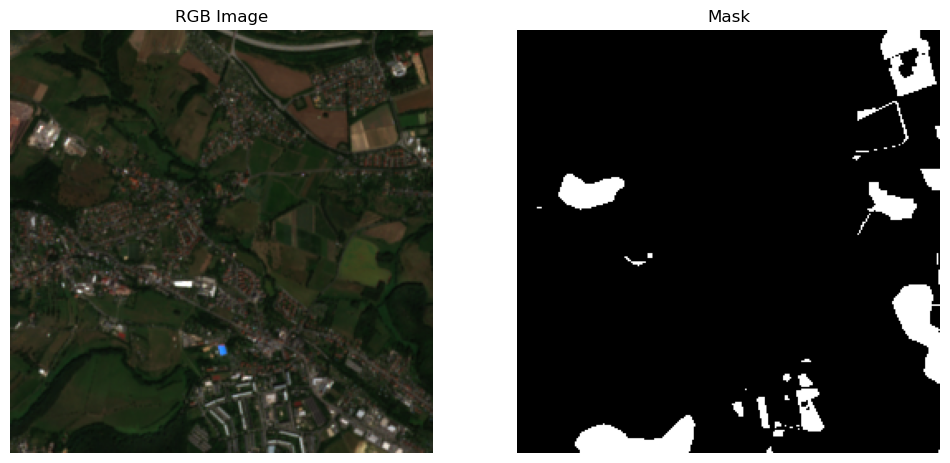

Sample 1:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.07


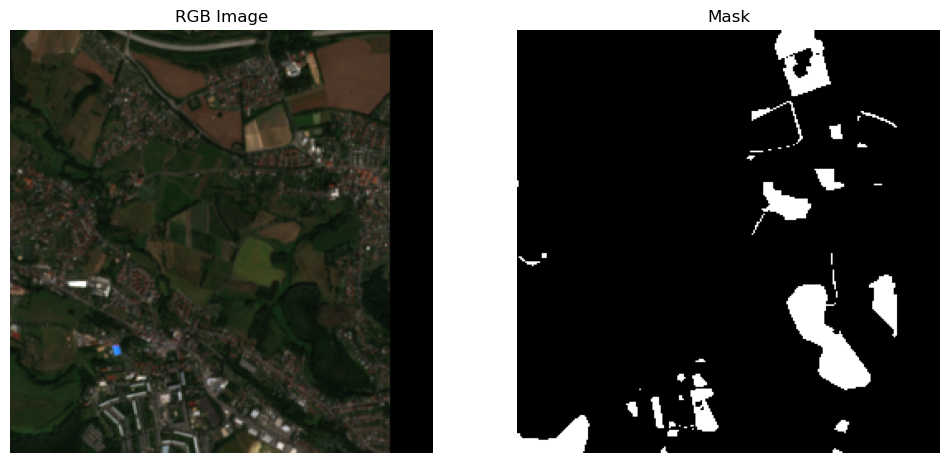

Sample 2:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.05


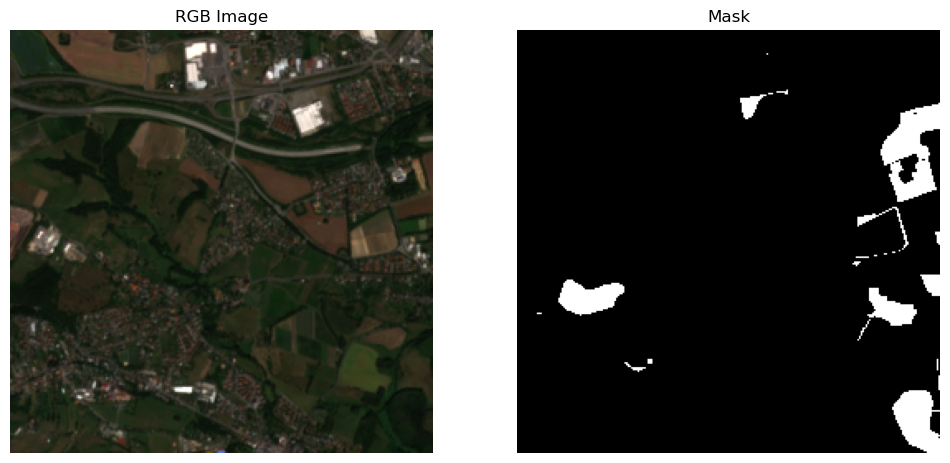

Sample 3:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.05


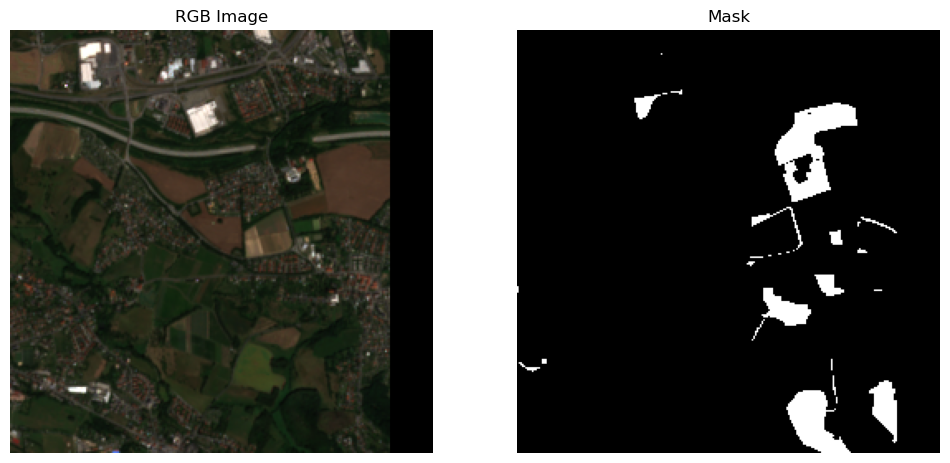

Sample 4:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.05


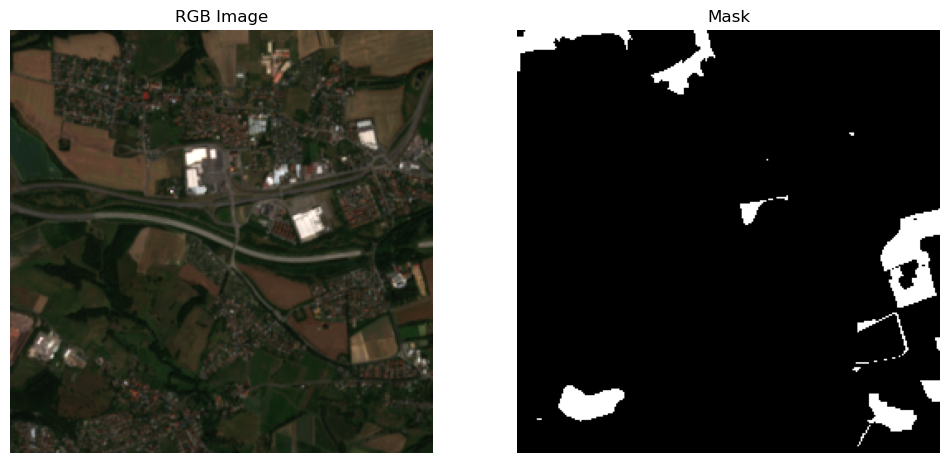

Sample 5:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.07


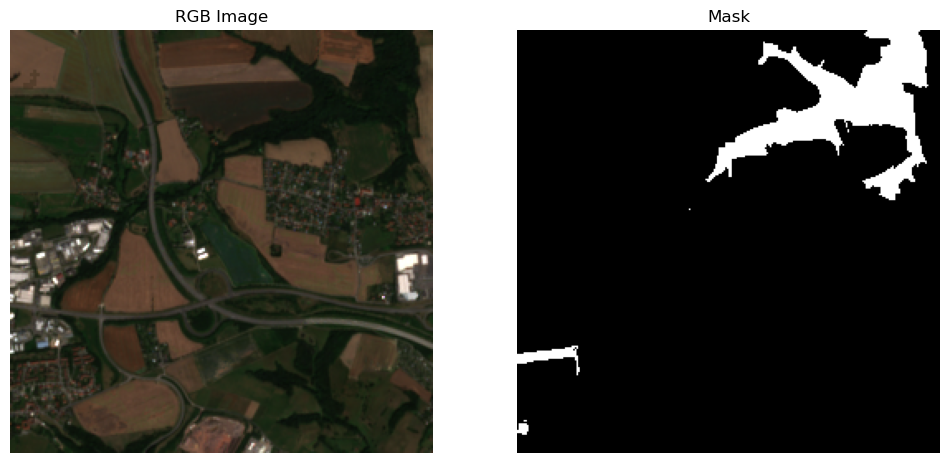

Sample 6:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.07


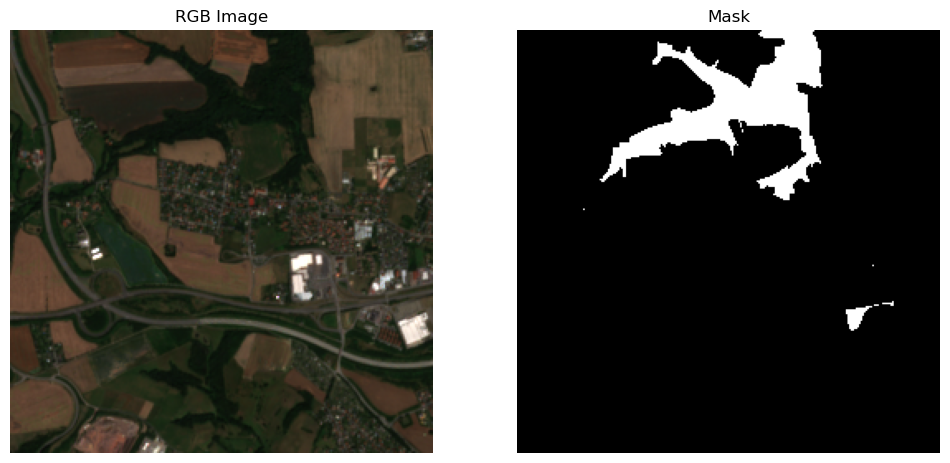

Sample 7:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.09


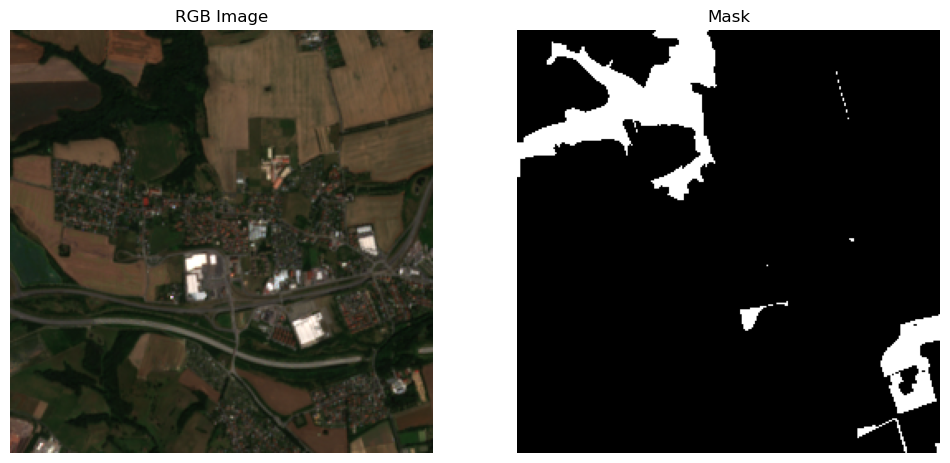

In [131]:
visualize_from_torchgeo_dataloader(val_loader, num_samples=3)

lower:  4.0
upper:  4276.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4255.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4129.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4105.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4109.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4077.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4409.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4280.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
Sample 0:
  Imag

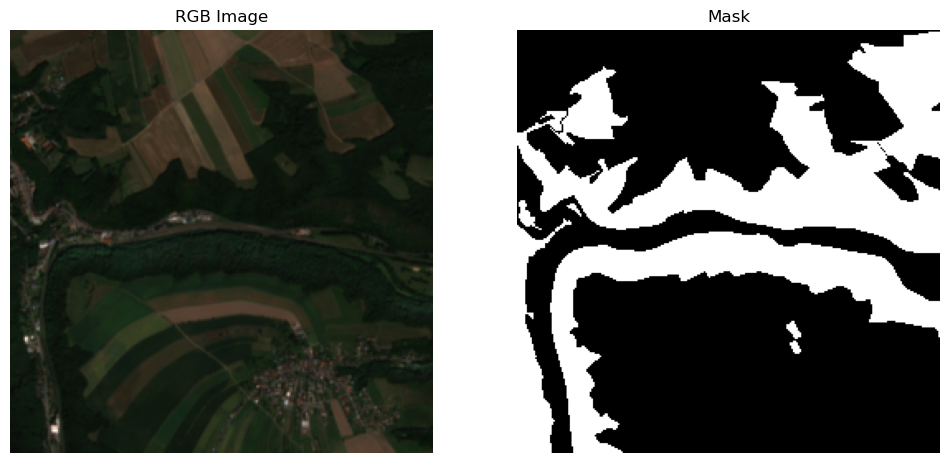

Sample 1:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.33


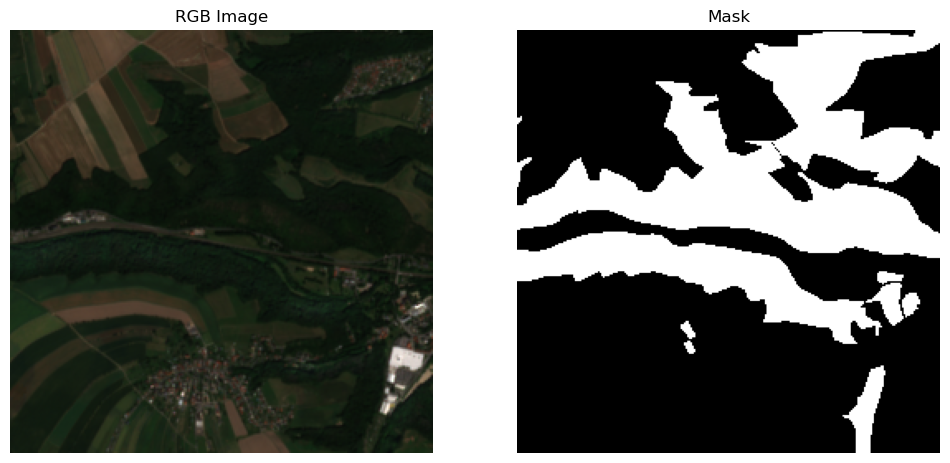

Sample 2:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.31


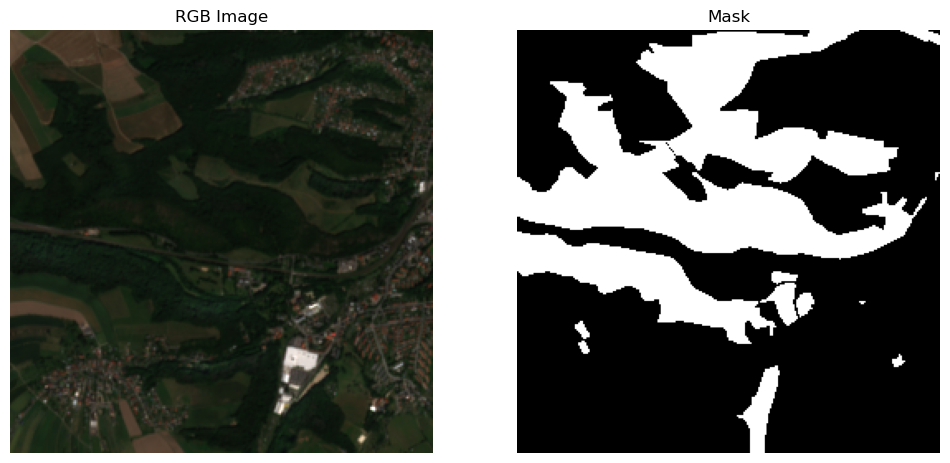

Sample 3:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.35


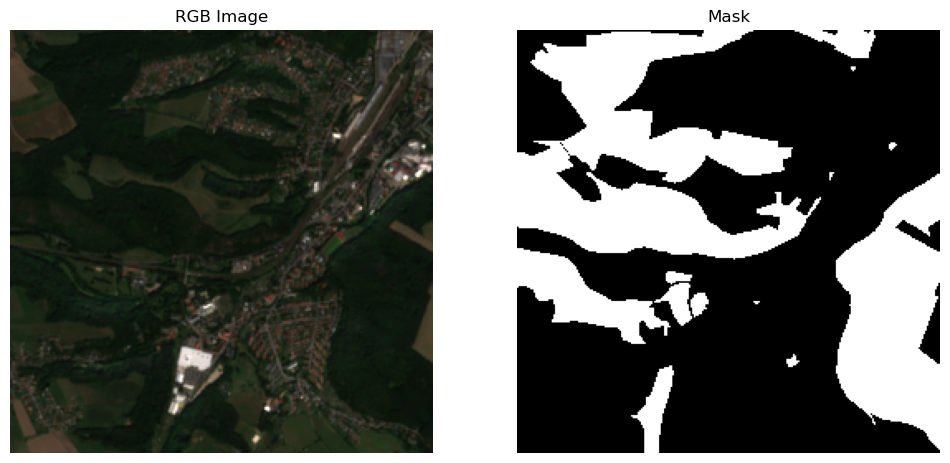

Sample 4:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.30


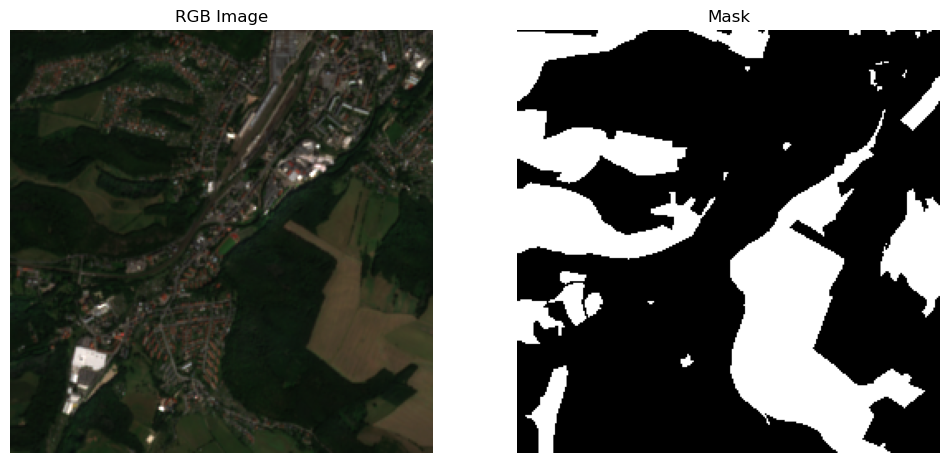

Sample 5:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.24


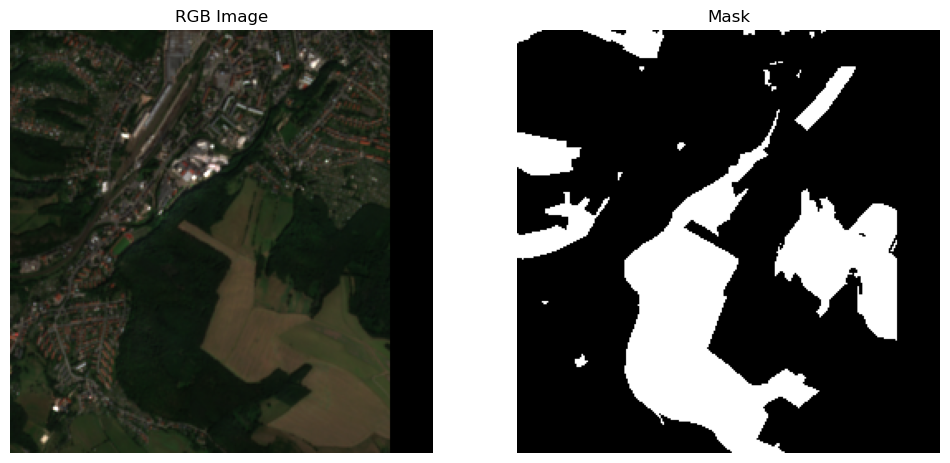

Sample 6:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.30


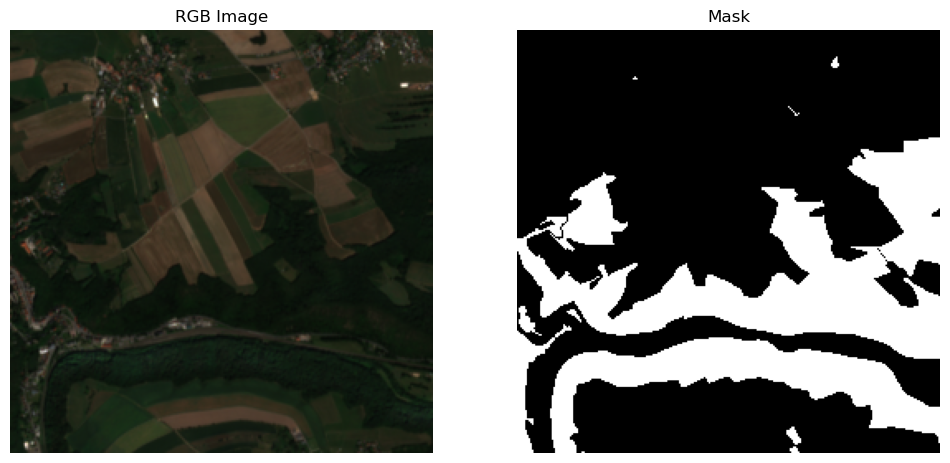

Sample 7:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.33


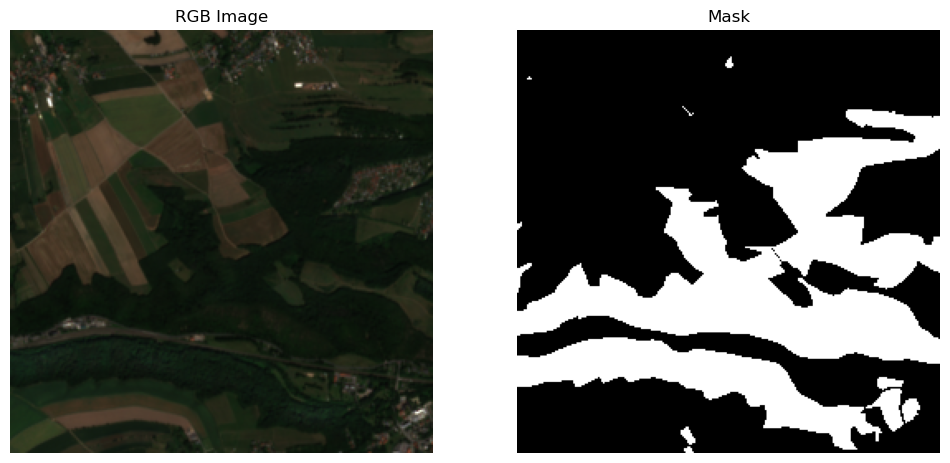

In [132]:
visualize_from_torchgeo_dataloader(test_loader, num_samples=3)

## Check the patches that doesn't fit perfectly with image boundary

In [61]:
def visualize_boundary_patches(dataset):
    bounds = dataset.bounds
    
    for bbox in dataset.sampler:
        # Check if bbox extends beyond dataset boundaries
        is_boundary_patch = (
            bbox.minx < bounds.minx or
            bbox.miny < bounds.miny or
            bbox.maxx > bounds.maxx or
            bbox.maxy > bounds.maxy
        )
        
        if is_boundary_patch:
            try:
                sample = dataset.dataset[bbox]
                
                # Apply normalization
                image, valid_area = contrast_stretch_patch(sample['image'])
                image = image.numpy()
                mask = process_mask(sample['mask'], valid_area)
                mask = mask.numpy()
                
                # Create visualization
                fig, axes = plt.subplots(1, 2, figsize=(10, 6))
                
                # For RGB visualization
                rgb = image[[3, 2, 1], :, :].transpose(1, 2, 0)
                axes[0].imshow(rgb)
                axes[0].set_title('Boundary Patch - Image')
                axes[0].axis('off')
                
                axes[1].imshow(mask, cmap='gray')
                axes[1].set_title('Boundary Patch - Mask')
                axes[1].axis('off')
                
                plt.suptitle(f"Boundary Patch at {bbox}")
                plt.tight_layout()
                plt.show()

                if input("Show next? (y/n): ") != 'y':
                    break
                    
            except Exception as e:
                print(f"Error processing boundary bbox {bbox}: {e}")

lower:  4.0
upper:  3828.0


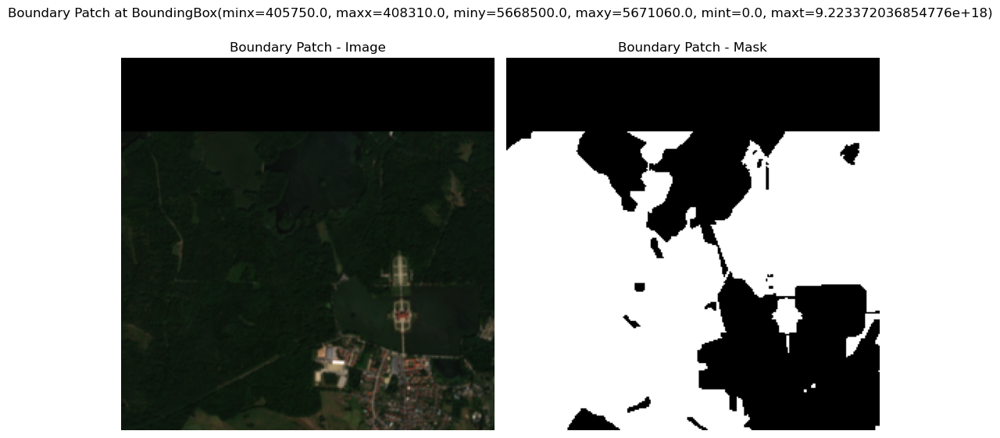

In [62]:
visualize_boundary_patches(test_dataset)

# Create custom GeoDataModule

In [95]:
from torchgeo.datamodules import GeoDataModule

In [96]:
class PugsGeoDataModule(GeoDataModule):
    def setup(self, stage: str) -> None:
        # Create datasets for each split
        self.train_dataset = create_dataset_split(train_image_path, label_path, 'train')
        self.val_dataset = create_dataset_split(val_image_path, label_path, 'validation')
        self.test_dataset = create_dataset_split(test_image_path, label_path, 'test')
        
        if stage in ["fit"]:
            self.train_batch_sampler = GridGeoSampler(
                self.train_dataset, self.patch_size, self.batch_size, self.length
            )
        if stage in ["fit", "validate"]:
            self.val_sampler = GridGeoSampler(
                self.val_dataset, self.patch_size, self.patch_size
            )
        if stage in ["test"]:
            self.test_sampler = GridGeoSampler(
                self.test_dataset, self.patch_size, self.patch_size
            )

In [99]:
from torchgeo.datasets import GeoDataset

datamodule = PugsGeoDataModule(
    dataset_class = GeoDataset, # GeoDataModule kwargs
    batch_size = 8, # GeoDataModule kwargs
    patch_size = 256, # GeoDataModule kwargs
    length = 100, # GeoDataModule kwargs
    num_workers = 2 # GeoDataModule kwargs
)

# Test creating model

In [133]:
from lightning.pytorch import Trainer

from torchgeo.models import ResNet50_Weights
from torchgeo.trainers import SemanticSegmentationTask

In [134]:
# batch_size = 10
# num_workers = 2
# max_epochs = 10
# fast_dev_run = False

In [135]:
weight_test = ResNet50_Weights.SENTINEL2_ALL_MOCO

In [ ]:
task = SemanticSegmentationTask(
    loss='ce',
    model='unet',
    backbone="resnet50",
    weights=weight_test,
    in_channels=13,
    num_classes=2,
    lr=0.1,
    patience=5,
)

In [140]:
trainer = Trainer(max_epochs=10)

trainer.fit(model=task, train_dataloaders=train_loader, val_dataloaders=val_loader)

INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: 
  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | Unet             | 32.6 M | train
1 | criterion     | CrossEntropyLoss | 0      | train
2 | train_metrics | MetricCollection | 0      | train
3 | val_metrics   | MetricCollection | 0      | train
4 | test_metrics  | MetricCollection | 0      | train
-----------------------------------------------------------
32.6 M    Trainable params
0         Non-trainable params
32.6 M    Total params
130.210   Total estimated model params size (MB)
233       Modules in train mode
0         Modules 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


lower:  5.0
upper:  4134.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4126.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  5.0
upper:  4236.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4183.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  5.0
upper:  4195.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4271.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  5.0
upper:  4180.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  5.0
upper:  4149.849999999977
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
Sanit

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.
/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (33) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 0:   0%|          | 0/33 [00:00<?, ?it/s] lower:  5.0
upper:  4342.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
image shape after augmentation: torch.Size([1, 13, 256, 256])
mask shape after augmentation: torch.Size([1, 13, 256, 256])
lower:  4.0
upper:  3983.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
image shape after augmentation: torch.Size([1, 13, 256, 256])
mask shape after augmentation: torch.Size([1, 13, 256, 256])
lower:  4.0
upper:  4289.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
image shape after augmentation: torch.Size([1, 13, 256, 256])
mask shape after augmentation: torch.Size([1, 13, 256, 256])
lower:  5.0
upper:  4129.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
image shape after augmentation: torch.Size([1, 13, 256, 256])
mask shape after augmentation

INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 33/33 [04:32<00:00,  0.12it/s, v_num=3]


In [142]:
trainer.test(model=task, dataloaders=test_loader)

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]lower:  4.0
upper:  4276.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4255.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4129.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4105.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4109.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4077.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4409.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'bounds', 'image', 'mask'])
lower:  4.0
upper:  4280.0
torch.Size([13, 256, 256])
torch.Size([256, 256])
dict_keys(['crs', 'b

[{'test_loss': 0.8957005739212036,
  'test_MulticlassAccuracy': 0.7344297766685486,
  'test_MulticlassJaccardIndex': 0.5803152918815613}]